# Noise Reduction
Sample below is taken from https://github.com/timsainb/noisereduce

The algorthim is very similiar to how audacity perfoms it

https://wiki.audacityteam.org/wiki/How_Audacity_Noise_Reduction_Works
1. Compute FFT clip
2. Compute stats of noise + threshold area
3. compute mask + smoothed(windowing) and then applied + inverted

More Noise Reduction Algorthims/Resources:
- There are deep learning ways to do this, but it needs lot of samples
    - https://developer.nvidia.com/blog/nvidia-real-time-noise-suppression-deep-learning/
- [Efficency of diff algorthims](https://www.researchgate.net/publication/325423964_Efficiency_analysis_of_noise_reduction_algorithms_Analysis_of_the_best_algorithm_of_noise_reduction_from_a_set_of_algorithms)
- Kalman/Statistical Filter

There is a lot of noise reduction literature out there, so a quick search should find what you are looking for

Sample Noise reduction taken from: https://github.com/timsainb/noisereduce

In [1]:
import IPython
from scipy.io import wavfile
import noisereduce as nr
import soundfile as sf
import librosa
from noisereduce.generate_noise import band_limited_noise
import matplotlib.pyplot as plt
import urllib.request
import numpy as np
import io
%matplotlib inline

/home/vikranth/Documents/berkeley/venv/lib/python3.8/site-packages/noisereduce/noisereduce.py:5: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm


In [3]:
url = "https://raw.githubusercontent.com/timsainb/noisereduce/master/assets/fish.wav"
response = urllib.request.urlopen(url)
data, rate = sf.read(io.BytesIO(response.read()))
data = data
IPython.display.Audio(data=data, rate=rate)

In [4]:
def add_noise(data):
    noise_len = 2 # seconds
    noise = band_limited_noise(min_freq=2000, max_freq = 12000, samples=len(data), samplerate=rate)*10
    noise_clip = noise[:rate*noise_len]
    audio_clip_band_limited = data+noise
    return audio_clip_band_limited, noise_clip
noisy_data, noise_clip = add_noise(data)
IPython.display.Audio(data=noisy_data, rate=rate)

  0%|          | 0/7 [00:00<?, ?it/s]

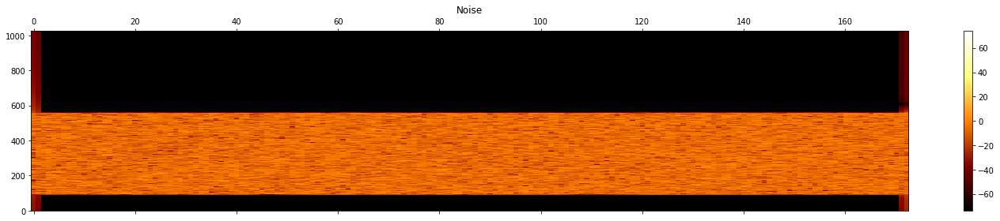

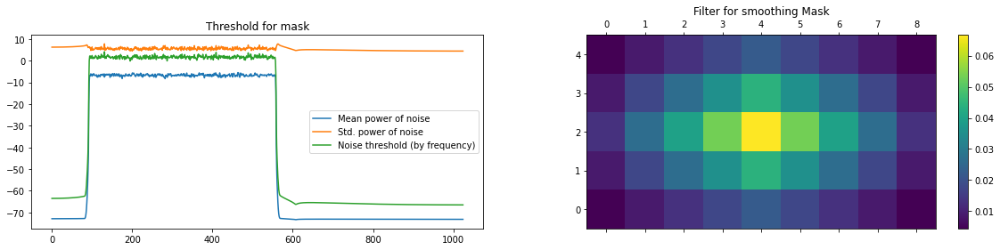

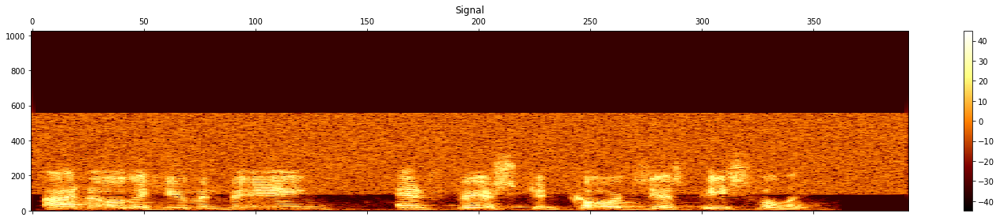

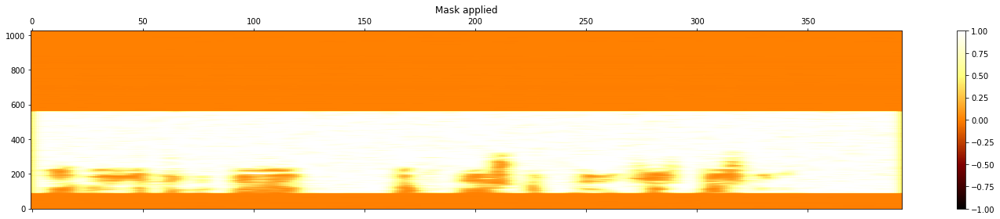

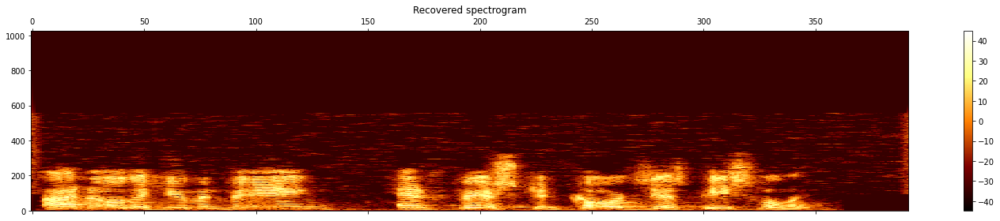

In [5]:
noise_reduced = nr.reduce_noise(audio_clip=noisy_data, noise_clip=noise_clip, verbose=True)
IPython.display.Audio(data=noise_reduced, rate=rate)

# Audio Fingerprinting

Popular apps like shazaam(that got acquired by Apple and is in every iphone) use audio fingerprinting. Given a song, it generates a set of identifiers, and searches an audio database to find a match and identify the song

1. Compute FFT 
2. Compute the Power spectogram of the signal
3. Use peak detection to find important peaks across spectogram
    4. This can be implemented with a max filter
4. Use hashing algorthim to find important parts of signal


[1] *An industrial strength audio search algorithm.* [[Link](http://www.ee.columbia.edu/~dpwe/papers/Wang03-shazam.pdf)].  
[2] *Audio fingerprinting with Python and Numpy.* [[Link](https://willdrevo.com/fingerprinting-and-audio-recognition-with-python/)].


If you want more details on the full implementation, check out https://github.com/worldveil/dejavu

Also a really good EE 120 lab on this. If anyone is interested, I could send it out.

In [6]:
song_name = "dejavu_repo/mp3/Field of Hopes and Dreams.mp3"
sample_fingerprint_song, fs = librosa.load(song_name)
sample_fingerprint_song_subset = sample_fingerprint_song[:fs*3]

# djv.fingerprint_directory("fingerprint_audio_files", [".mp3"], 3)
# print(djv.db.get_num_fingerprints())

/home/vikranth/Documents/berkeley/venv/lib/python3.8/site-packages/librosa/core/audio.py:162: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")


In [7]:
IPython.display.Audio(data=sample_fingerprint_song, rate=fs)

In [8]:
IPython.display.Audio(data=sample_fingerprint_song_subset, rate=fs)

In [77]:
sf.write('dejavu_repo/test_fingerprint_3.wav', sample_fingerprint_song_subset, fs, subtype='PCM_24')

In [9]:
import subprocess
cmd = "docker exec f93d5dfc97cc python example_docker_postgres.py test_fingerprint_3.wav"
proc = subprocess.Popen(
            cmd, stdin=subprocess.PIPE, stdout=subprocess.PIPE, shell=True
)
read_lines = proc.stdout.readlines()
print(read_lines)

[b'Checking fingerprint for file test_fingerprint_3.wav\n', b"No shortcut, we recognized: {'total_time': 0.07433724403381348, 'fingerprint_time': 0.022739648818969727, 'query_time': 0.041905879974365234, 'align_time': 0.00935673713684082, 'results': [{'song_id': 33, 'song_name': b'Field of Hopes and dreams Remix', 'input_total_hashes': 1318, 'fingerprinted_hashes_in_db': 63042, 'hashes_matched_in_input': 1696, 'input_confidence': 1.29, 'fingerprinted_confidence': 0.03, 'offset': 0, 'offset_seconds': 0.0, 'file_sha1': b'2682B0D20CF22B47685DB5E275EB140014914D41'}, {'song_id': 10, 'song_name': b'Brad-Sucks--Total-Breakdown', 'input_total_hashes': 1318, 'fingerprinted_hashes_in_db': 75062, 'hashes_matched_in_input': 21, 'input_confidence': 0.02, 'fingerprinted_confidence': 0.0, 'offset': 1360, 'offset_seconds': 63.15828, 'file_sha1': b'02A83F248EFDA76A46C8B2AC97798D2CE9BC1FBE'}]}\n", b'\n']


In [10]:
noisy_data, noise_clip = add_noise(sample_fingerprint_song_subset)
sf.write('dejavu_repo/test_fingerprint_3.wav', sample_fingerprint_song_subset, fs, subtype='PCM_24')
IPython.display.Audio(data=noisy_data, rate=fs)

In [11]:
import subprocess
cmd = "docker exec f93d5dfc97cc python example_docker_postgres.py test_fingerprint_3_noisy.wav"
proc = subprocess.Popen(
            cmd, stdin=subprocess.PIPE, stdout=subprocess.PIPE, shell=True
)
read_lines = proc.stdout.readlines()
print(read_lines)

[b'Checking fingerprint for file test_fingerprint_3_noisy.wav\n', b"No shortcut, we recognized: {'total_time': 0.07896947860717773, 'fingerprint_time': 0.02482748031616211, 'query_time': 0.04362630844116211, 'align_time': 0.010114908218383789, 'results': [{'song_id': 33, 'song_name': b'Field of Hopes and dreams Remix', 'input_total_hashes': 1318, 'fingerprinted_hashes_in_db': 63042, 'hashes_matched_in_input': 1696, 'input_confidence': 1.29, 'fingerprinted_confidence': 0.03, 'offset': 0, 'offset_seconds': 0.0, 'file_sha1': b'2682B0D20CF22B47685DB5E275EB140014914D41'}, {'song_id': 10, 'song_name': b'Brad-Sucks--Total-Breakdown', 'input_total_hashes': 1318, 'fingerprinted_hashes_in_db': 75062, 'hashes_matched_in_input': 21, 'input_confidence': 0.02, 'fingerprinted_confidence': 0.0, 'offset': 1360, 'offset_seconds': 63.15828, 'file_sha1': b'02A83F248EFDA76A46C8B2AC97798D2CE9BC1FBE'}]}\n", b'\n']


# Wake word detection

There are a few ways to handle wake word recognition. It has been heavily optimized and tested with benchmarks like MLPerf. 

The HMM Aproach: Run a sliding window on the spectogram and try to run bayes model net on it. This uses the observable content in each audio frame. This can be decoded using MLE/viterbi algorthim. There is a lot of phoenetics around it especially when trying to infer context.

![HMM](https://miro.medium.com/max/700/1*3KjCjtiap3KUDYKXyM7EJA.jpeg)

Credit: https://jonathan-hui.medium.com/speech-recognition-gmm-hmm-8bb5eff8b196 good series of articles on how speech recogntition work

This HMM can be thrown through a DNN to get our classification. 
Some examples of current wake word tech:
- https://www.amazon.science/blog/alexa-scientists-present-two-new-techniques-that-improve-wake-word-performance

- [Accurate Detection of Wake Word Start and End Using a CNN](https://arxiv.org/pdf/2008.03790.pdf)

The simple approach we use is just to process after text to speech.

EE225E is a good course if you're interested in this

# Vad Detection 

Vad detection detects the chunks of audio that is important and that we need to keep. Some detectors use the energy of a signal over time(||x||^2). Others try to use the spectral shape with analyzing signal frequencies. However, like most problems nowdays, machine learning can solve this task pretty well. 

Really good resource on this detection by AAlto university: https://wiki.aalto.fi/pages/viewpage.action?pageId=151500905

Note: The vad detection used below is a python wrapper on something google made for detection. There is a "aggressiveness constant" that might need to be tweaked for the application.

In [23]:
from typing import List, AnyStr, Optional
from webrtcvad_example import create_chunks
import os
import shutil
import subprocess
class VadDetector:
    def chunk_recording(
        self, wave_path: str, chunk_folder_name: Optional[str]
    ) -> List[str]:
        if chunk_folder_name is None:
            chunk_folder_name = wave_path + "_chunks"
        if os.path.exists(chunk_folder_name):
            shutil.rmtree(chunk_folder_name)
        os.mkdir(chunk_folder_name)
        try:
            segments, full_paths = create_chunks(
                vad_agg=2, wave_path=wave_path, folder_name=chunk_folder_name
            )
            print("trying to create chunks")
        except Exception as e:
            print("Warning: Invalid wav file at ", wave_path)
            print(e)
            return []
        print("chunk recording")
        return full_paths
def convert_channel_sample_rate(file_name, channel_size=1, sample_rate=16000):
    f_name, f_ext = os.path.splitext(file_name)
    if f_ext != ".wav":
        new_path = f_name + ".wav"
        if not os.path.exists(new_path):
            proc = subprocess.Popen(
                f"ffmpeg -y -i {file_name} -vn {new_path}",
                stdin=subprocess.PIPE,
                stdout=subprocess.PIPE,
                shell=True,
            ).wait()
    else:
        new_path = file_name
    final_path = f_name + "_channel_1_16000" + ".wav"
    if not os.path.exists(final_path):
        proc = subprocess.Popen(
            f"sox {new_path} -c {channel_size} -r {sample_rate} {final_path}",
            stdin=subprocess.PIPE,
            stdout=subprocess.PIPE,
            shell=True,
        ).wait()
    return final_path


In [24]:
file_name = "test_vad.wav"
data, fs = librosa.load(file_name)
IPython.display.Audio(data=data, rate=fs)

In [25]:
file_path_sampled_rate = convert_channel_sample_rate("test_vad.wav")
chunked_paths = VadDetector().chunk_recording(file_path_sampled_rate, None)


16000
000000000001111111111+(0.33000000000000007)11111111111111111111111111111111111111111111111111111111111111111111111111110000000001111111111111111111111111111111001111100000000011111111111111111111111111111111111111111111111111110011111110000000000-(6.720000000000011)00000000000000000000000000000000000000000000000
trying to create chunks
chunk recording


In [26]:
for path in chunked_paths:
    file_name = path
    data, fs = librosa.load(file_name)
    IPython.display.display(IPython.display.Audio(data=data, rate=fs))

# Text Classification

The idea with this is to run it encoding the vector using Infersent/Glove. Then it run through the NN.



In [27]:
from general_classifier.general_classifier import GeneralClassifierSkill
classifier = GeneralClassifierSkill()

/home/vikranth/Documents/berkeley/venv/lib/python3.8/site-packages/torch/serialization.py:658: SourceChangeWarning: source code of class 'models.InferSent' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/home/vikranth/Documents/berkeley/venv/lib/python3.8/site-packages/torch/serialization.py:658: SourceChangeWarning: source code of class 'torch.nn.modules.rnn.LSTM' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)


In [55]:
classifier.classify("")

('Weather', array([0.9990396], dtype=float32))

In [56]:
classifier.classify("What's the ")

('Time', array([0.9217955], dtype=float32))

In [62]:
classifier.classify("We should go out to play some basketball this week")

('oos', array([0.41086575], dtype=float32))